In [1]:
%pylab inline

import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

from ddmap import halosim
from ddmap.pixel3D import cartesianGrid3D
from ddmap.sparse import darkmapper
from ddmap import detect3D
from ddmap.halolet import massmap_ks2D

Populating the interactive namespace from numpy and matplotlib


In [2]:
# configuration
configName  =   '../../tests/config_sparse.ini' 
parser      =   ConfigParser()
parser.read(configName)

# Reconstruction Init
parser.set('sparse','mu','3e-4')
if False:
    atomFname='../../tests/haloBasis-nl10-pix48-m146_152.fits'
    parser.set('lens','atomFname',atomFname)
    parser.set('sparse','nframe','1' )
else:
    parser.set('lens','resolve_lim','0.2') #pix
    parser.set('lens','rs_base','0.31')    #Mpc/h
    parser.set('sparse','nframe','1' )
    
# Pixelation
gridInfo=   cartesianGrid3D(parser)
Z,Y,X   =   np.meshgrid(gridInfo.zcgrid,gridInfo.ycgrid,gridInfo.xcgrid,indexing='ij')
x,y,z   =   (X.flatten(),Y.flatten(),Z.flatten())
lensKer1 =   gridInfo.lensing_kernel(deltaIn=False)
lensKer2 =   gridInfo.lensing_kernel(deltaIn=True)

In [40]:
gErr    =  np.ones(gridInfo.shape)*1e-3
z_h     =  0.2425
log_m   =  14.745
M_200   =  10.**(log_m)
conc    =  4.#6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo    =  halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
lk      =  halo.lensKernel(z)
data1   =  halo.DeltaSigmaComplex(x*3600.,y*3600.)*lk
data1   =  data1.reshape(gridInfo.shape)

ks2D=massmap_ks2D(gridInfo.ny,gridInfo.nx)
rpix=halo.rs_arcsec/gridInfo.scale/3600.
sigma=halosim.haloCS02SigmaAtom(rpix,ny=gridInfo.ny,nx=gridInfo.nx,\
                                c=halo.c,fou=True)
shear=np.fft.fftshift(ks2D.transform(sigma,inFou=True,outFou=False))
lk2=lk.reshape(gridInfo.shape)
data2=shear[None,:,:]*lk2*2e15
    
dmapper=darkmapper(parser,data2.real,data2.imag,gErr,lensKer1)

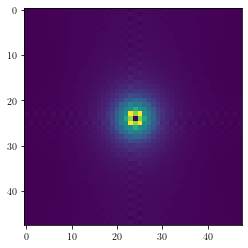

In [41]:
plt.imshow(np.abs(data2[6]));

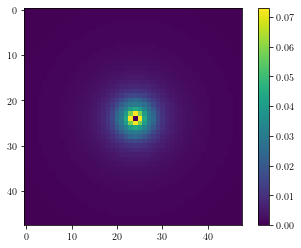

In [42]:
data1[:,24,24]=0.
plt.imshow(np.abs(data1[6]));
plt.colorbar()

In [43]:
np.sum(np.abs(data1))

54.63292571804921

In [44]:
np.sum(np.abs(data2))

77.72965835731169

In [45]:
print(halo.rs)
print(conc)

0.3089626902665355
4.0


In [46]:
print(halo.rs_arcsec/gridInfo.scale/3600.)
print(dmapper.dict2D.rs_frame)

0.962121618136783
[[3.06522341]
 [1.87746964]
 [1.39231829]
 [1.12953695]
 [0.96535184]
 [0.85348029]
 [0.77269328]
 [0.71188289]
 [0.66467247]
 [0.62713966]]


# sparse analysis

CPU times: user 12.2 s, sys: 6.4 ms, total: 12.2 s
Wall time: 12.2 s


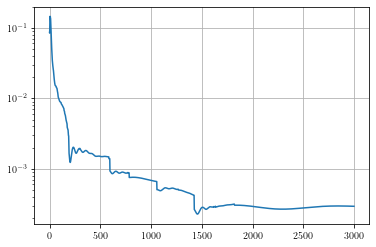

In [47]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
dmapper.clean_outcomes()
dmapper.fista_gradient_descent(3000)
#dmapper.optimized_gradient_descent(3000)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 12.4 s, sys: 0 ns, total: 12.4 s
Wall time: 12.5 s


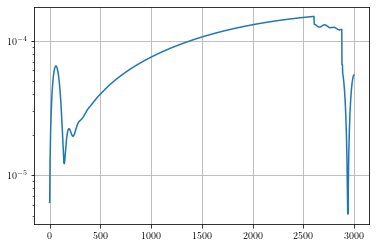

In [48]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 13.6 s, sys: 3.02 ms, total: 13.6 s
Wall time: 13.6 s


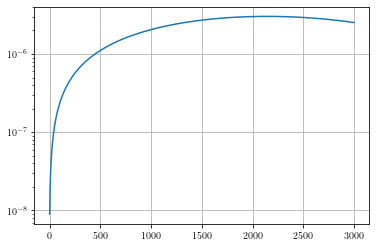

In [50]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

In [51]:
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(dmapper.deltaR[:,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

In [52]:
src

iz,iy,ix,value
float64,float64,float64,float64
5.0,24.0,24.0,67.82080210832254


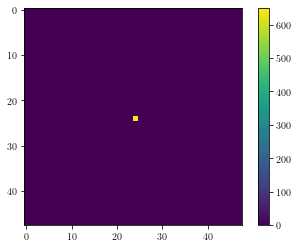

In [53]:
plt.imshow(dmapper.alphaR[5,0])
plt.colorbar()

In [54]:
dmapper.alphaR[:,0,24,24]

array([  0.        ,   0.        ,   0.        ,   0.        ,
       641.16406545, 651.32685122,   0.        ,   0.        ,
         0.        ,   0.        ])

In [55]:
gridInfo.zlcgrid

array([0.0625, 0.1075, 0.1525, 0.1975, 0.2425, 0.2875, 0.3325, 0.3775,
       0.4225, 0.4675])